Today, I'd like to start generating posts for our mathematics center as part of a marketing effort.
In a [past post]({{< ref "blog/vizualizing-attendance-data.md" >}} I described how the raw data is exported and can be processed to create one graphic we typically report; in the interest of modularity, I leverage [a separate package](https://github.com/FITMath/SwiperDataDownloader) to download and manage the data files.
My goal is to "operationalize" that report by generating the corresponding graphs regularly along with a stub blog post;  that is, we need to make sure the script is robust enough for our environment and (to ensure that) test it extensively.

Our regular reporting includes metrics for the busiest times of the day, busiest day of the week, and the breakdown of student activities, etc. and I figure there's no reason we shouldn't at least share the busy hours with students for planning purposes.

I currently have a script running on our university server that generates detailed report information in a CSV format; we'll need to extract only the data we're interested in, process it, and create the graphs.

I have some other plans for reports and algorithms to run on this data, so let's leverage some existing packages to do this work. I'm going to use [Julia](https://julialang.org/) as my implementation language this time around since it's easy to get up-and-running in a CI situation, which will help generate these pages automatically in the future; [there are other advantages, as well](https://github.com/malmaud/TensorFlow.jl/blob/master/docs/src/why_julia.md), nearly all of this would work just as well in Python.
[See this post](https://jgoldfar.github.io/blog/vizualizing-attendance-data/) for a comparison with similar data.

[CSV.jl](http://juliadata.github.io/CSV.jl/stable/) will provide basic data import functionality, and [Plots.jl](https://github.com/JuliaPlots/Plots.jl) (most likely with the default backend) will be used for plotting.

In [1]:
using Pkg
Pkg.activate(@__DIR__)
Pkg.instantiate()
Pkg.API.precompile()

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Precompiling project...


To prototype the process, we'll work with a small amount of data:

In [2]:
dataFileDir = joinpath(@__DIR__, "MAC-swipes")
dataFiles = filter(x->endswith(x, ".csv"), readdir(dataFileDir))

3-element Array{String,1}:
 "all-11-30-2018.csv"
 "all-12-07-2018.csv"
 "all-12-14-2018.csv"

In [3]:
using Dates
# Define the date format for attendance data:
const fileDF = dateformat"Y-m-d H:M:S"

dateformat"Y-m-d H:M:S"

In [4]:
using CSV
# Note: The first row is noise (output from the generating script)
dataFile = joinpath(dataFileDir, dataFiles[1])
headerRow = startswith(readline(dataFile), "cmdOut") ? 2 : 1
f = CSV.File(dataFile, header=headerRow, normalizenames=true, dateformat=fileDF, types=Dict(8 => Union{Missing, DateTime}, 9 => Union{Missing, DateTime}))

CSV.File("/Users/jgoldfar/Documents/work/projects/personal-site/content/blog/generating-attendance-reports/MAC-swipes/all-11-30-2018.csv", rows=579):
Tables.Schema:
 :FIT_ID      Union{Missing, String}  
 :TRACKS      Union{Missing, String}  
 :First_Name  Union{Missing, String}  
 :Last_Name   Union{Missing, String}  
 :Email       Union{Missing, String}  
 :Class       Union{Missing, String}  
 :Context     Union{Missing, String}  
 :Time_In     Union{Missing, DateTime}
 :Time_Out    Union{Missing, DateTime}
 :Total_Time  Union{Missing, String}  

Since we're going to run a few processes over the same data, we'll initialize all of them simultaneously and fill in the details as we iterate through the data file.

In [5]:
visitorIDs = Set{String}()
busyHoursData = zeros(Int64, 23)
busyDaysData = zeros(Int64, 7)
totalDailyTutoringTime = zeros(Float64, 7)
reasonForVisit = Dict{String, Int}()
reasonForVisitClass = Dict{String, Int}()
for row in f
    studentID = row.FIT_ID
    if !ismissing(studentID)
        push!(visitorIDs, studentID)
    end
    
    timein = row.Time_In
    if ismissing(timein)
        continue
    end
    busyHoursData[Dates.hour(timein)] += 1
    busyDaysData[Dates.dayofweek(timein)] += 1
    
    # Extract context histogram information
    rowContext = row.Context
    if ismissing(rowContext)
        reasonForVisit["Unknown"] += 1
    else
        if haskey(reasonForVisit, rowContext)
            reasonForVisit[rowContext] += 1
        else
            reasonForVisit[rowContext] = 1
        end
    end
    
    # Extract class histogram information
    rowClass = row.Class
    if ismissing(rowClass)
        reasonForVisitClass["Unknown"] += 1
    else
        if haskey(reasonForVisitClass, rowClass)
            reasonForVisitClass[rowClass] += 1
        else
            reasonForVisitClass[rowClass] = 1
        end
    end
    
    timeout = row.Time_Out
    if ismissing(timeout)
        continue
    end
    timediff = timeout - timein
    totalDailyTutoringTime[Dates.dayofweek(timein)] += timediff.value / (1000 * 60) # milliseconds -> minutes
end

Here's a brief summary of the activity in MAC during the given week:

In [7]:
using Printf
@printf "A total of %d unique visitors came into MAC this week, spending a collective %0.1f hours receiving services." length(visitorIDs) sum(totalDailyTutoringTime/60)

A total of 223 unique visitors came into MAC this week, spending a collective 495.1 hours receiving services.

Add `using Printf` to your imports.
  likely near /Users/jgoldfar/.julia/packages/IJulia/DL02A/src/kernel.jl:41


Now, let's create some plots...

In [8]:
using Plots

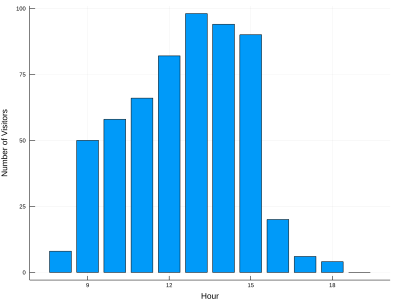

In [9]:
bar(8:19, busyHoursData[8:19],
    size=(800, 600), dpi=200, xlabel="Hour", ylabel="Number of Visitors",
    label="")

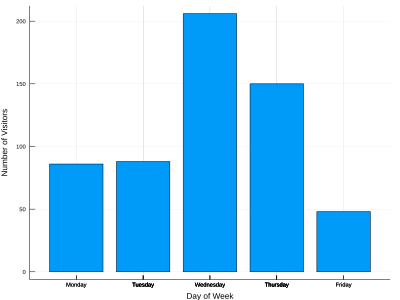

In [10]:
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]
bar(days, busyDaysData[1:5],
    size=(800, 600), dpi=200, xlabel="Day of Week", ylabel="Number of Visitors",
    label="")

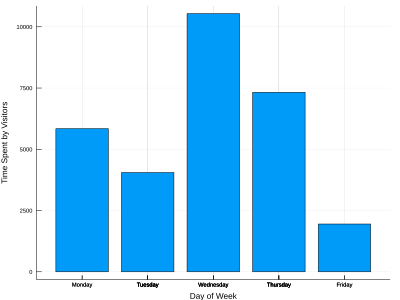

In [11]:
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]
bar(days, totalDailyTutoringTime[1:5],
    size=(800, 600), dpi=200, xlabel="Day of Week", ylabel="Time Spent by Visitors",
    label="")

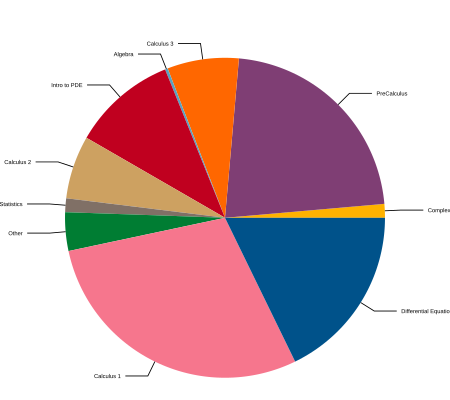

In [12]:
using Measures
delete!(reasonForVisitClass, "NULL")
pie(collect(keys(reasonForVisitClass)), collect(values(reasonForVisitClass)),
    size=(900, 800), dpi=200, left_margin=20mm, right_margin=20mm)

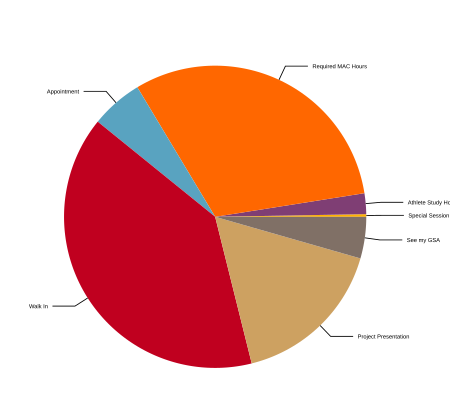

In [13]:
delete!(reasonForVisit, "NULL")
pie(collect(keys(reasonForVisit)), collect(values(reasonForVisit)),
    size=(900, 800), dpi=200, left_margin=20mm, right_margin=30mm)

All that's left is to package up this experiment in a script, add it to our [data processing bundle](https://github.com/FITMath/SwiperDataDownloader), and automate the creation of new pages for our center's blog using Cron.

I find that for many purposes, a command-line interface is easiest to integrate with other tools; this probably stems from my experience with Unix-style tools and my exceptional age, since everything used to be command-line based!

While I've used [`ArgParse.jl`]() in the past for more complicated UIs, which is a relative of the corresponding (powerful) module for Python, these scripts just need to be pointed at data and allowed to run. Parsing input arguments in Julia is nearly trivial; they live in the `ARGS` global vector.
While (obviously) all of the dependencies will need to be loaded in order to process data, by doing our command line parsing first before loading e.g. `Plots` we can bail quickly if there's no data to be found.
This allows errors to be propogated as quickly as possible, which is essential for debugging.

To the extent possible, we [check]() for possible user input errors and give an informative message, including a usage message if we don't get the input we expect.
For instance, we need at least two arguments, so we check for that:
```julia
if length(ARGS) < 2
    usage()
    exit(-1)
end
```

Just because things happen, I'll often add a `--force` command line flag to my CLIs, which is a typicaly way to protect data you've already generated, possibly at great expense, unless you really mean to:
```julia
const useForce = "--force" in ARGS
```

Then we need to extract all of the `ARGS` that _aren't_ that flag:
```julia
const restARGS = filter(arg -> arg != "--force", ARGS)
```

The data extraction loop above is collected into a function that operates on a given input file; in order to support aggregation over multiple files, we define a method to combine the output fields in a sensible way:
```julia
function combineGraphicsData(d1, d2)
    visitorIDs = union(d1[1], d2[1])
    busyHoursData = d1[2] .+ d2[2]
    busyDaysData = d1[3] .+ d2[3]
    totalDailyTutoringTime = d1[4] .+ d2[4]
    reasonForVisit = merge(+, d1[5], d2[5]) # Combine dicts and add values with the same key
    reasonForVisitClass = merge(+, d1[6], d2[6])

    return (visitorIDs,
            busyHoursData,
            busyDaysData,
            totalDailyTutoringTime,
            reasonForVisit,
            reasonForVisitClass
            )
end
```

This is in fact a reduction function: it maps something of the form `H x H => H`; therefore, in order to combine data from multiple files, we simply map the data extraction routine we defined above to each input file, and then reduce the output with `combineGraphicsData`.
That is, we're just doing a `mapreduce` operation!
This is a good structure to give your code when possible, this tends to be implemented efficiently.
Once we've extracted all of the data, all that remains is to create the graphs we prototyped above and save them to the corresponding output files.
I also write out a data dictionary containing filenames and descriptions for later use, using the `Serialization` library.
We store filenames as the keys in a dict `outputFileDescriptions`, and the description in the value, and output it using
```julia
currFileStem = "fileDescriptions.jldat"
open(joinpath(dirOut, currFileStem), "w") do st
    serialize(st, outputFileDescriptions)
end
```

*Note*: Depending on the library, serialization formats have varying stability guarantees.
AFAIK, Julia guarantees stability across platforms, but not major language versions.

The post template generator is based on a simple Markdown file a machine-generated template, and (mostly) outputs a collection of links.

One final note on building something user friendly: while this is an internal tool likely to be maintained by a relatively small group, I _always_ document and simplify things as much as possible.
This is part of the reason for the maintainence of the usage message, and at least some information in the README file.
While evidently not a perfect system, I find that documentation in the source files themselves, supplemented with a `Makefile` is easiest to keep in sync with the actual implemented functionality, and for the kind of user I'm targeting, hopefully more cogent.

`make` is a good way to encode an precise (one might say *recommended*) sequence of command line calls and intermediate file dependencies in a relatively obvious way; I think of them as a form of documentation themselves, particularly when hand-written (as opposed to a `Makefile` generated by autotools, in which case looking to the corresponding `.in` files with quite a bit of time to poke around at macro definitions is required.)

For instance, Julia uses a `Project.toml` file to track package dependencies, and running our process requires an input file.
It would be convenient to generate the output corresponding to a particular file into a directory with a sensible name; all of this can be encoded into the make script
```make

```